In [1]:
import pandas as pd
import geopandas as gpd

In [2]:
chipotle = pd.read_csv('archivos/chipotle_stores.csv')
geo_json_data = gpd.read_file("https://raw.githubusercontent.com/python-visualization/folium-example-data/main/us_states.json")

In [3]:
chipotle.head()

,state,location,address,latitude,longitude
0,Alabama,Auburn,"346 W Magnolia Ave Auburn, AL 36832 US",32.606812966051244,-85.48732833164195
1,Alabama,Birmingham,"300 20th St S Birmingham, AL 35233 US",33.509721495414745,-86.80275567068401
2,Alabama,Birmingham,"3220 Morrow Rd Birmingham, AL 35235 US",33.59558141391436,-86.64743684970283
3,Alabama,Birmingham,"4719 Highway 280 Birmingham, AL 35242 US",33.42258214624579,-86.6982794650297
4,Alabama,Cullman,"1821 Cherokee Ave SW Cullman, AL 35055 US",34.15413376734492,-86.84122007667406


In [3]:
geo_json_data.head()

,id,name,geometry
0,AL,Alabama,"POLYGON ((-87.3593 35.00118, -85.60668 34.9847..."
1,AK,Alaska,"MULTIPOLYGON (((-131.60202 55.11798, -131.5691..."
2,AZ,Arizona,"POLYGON ((-109.0425 37.00026, -109.04798 31.33..."
3,AR,Arkansas,"POLYGON ((-94.47384 36.50186, -90.15254 36.496..."
4,CA,California,"POLYGON ((-123.23326 42.00619, -122.37885 42.0..."


In [5]:
geo_json_data.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [6]:
geo_json_data.to_crs(3395)

,id,name,geometry
0,AL,Alabama,"POLYGON ((-9724792.347 4139532.399, -9529691.4..."
1,AK,Alaska,"MULTIPOLYGON (((-14649869.965 7349718.784, -14..."
2,AZ,Arizona,"POLYGON ((-12138555.909 4413426.391, -12139165..."
3,AR,Arkansas,"POLYGON ((-10516779.985 4344479.482, -10035734..."
4,CA,California,"POLYGON ((-13718263.307 5133303.77, -13623151...."
5,CO,Colorado,"POLYGON ((-12013569.501 4984876.467, -11769693..."
6,CT,Connecticut,"POLYGON ((-8132281.538 5138209.842, -7992662.5..."
7,DE,Delaware,"POLYGON ((-8395057.986 4810208.131, -8405422.7..."
8,FL,Florida,"POLYGON ((-9517497.755 3610426.769, -9462625.5..."
9,GA,Georgia,"POLYGON ((-9251672.822 4139532.399, -9275450.6..."


In [7]:
### Como pasar de una tabla normal a una geografica

In [8]:
chipotle.columns

Index(['state', 'location', 'address', 'latitude', 'longitude'], dtype='object')

In [9]:
chipotle = gpd.GeoDataFrame(chipotle,geometry=gpd.points_from_xy(chipotle['longitude'], chipotle['latitude']))

In [10]:
chipotle.columns

Index(['state', 'location', 'address', 'latitude', 'longitude', 'geometry'], dtype='object')

In [11]:
chipotle.crs

In [12]:
chipotle = gpd.GeoDataFrame(chipotle,geometry=gpd.points_from_xy(chipotle['longitude'], chipotle['latitude']),crs='4326')

In [13]:
chipotle.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [14]:
chipotle.head()

,state,location,address,latitude,longitude,geometry
0,Alabama,Auburn,"346 W Magnolia Ave Auburn, AL 36832 US",32.606813,-85.487328,POINT (-85.48733 32.60681)
1,Alabama,Birmingham,"300 20th St S Birmingham, AL 35233 US",33.509721,-86.802756,POINT (-86.80276 33.50972)
2,Alabama,Birmingham,"3220 Morrow Rd Birmingham, AL 35235 US",33.595581,-86.647437,POINT (-86.64744 33.59558)
3,Alabama,Birmingham,"4719 Highway 280 Birmingham, AL 35242 US",33.422582,-86.698279,POINT (-86.69828 33.42258)
4,Alabama,Cullman,"1821 Cherokee Ave SW Cullman, AL 35055 US",34.154134,-86.841220,POINT (-86.84122 34.15413)


In [14]:
### Tabla lista para usar mostrar de modo rapido

<Axes: >

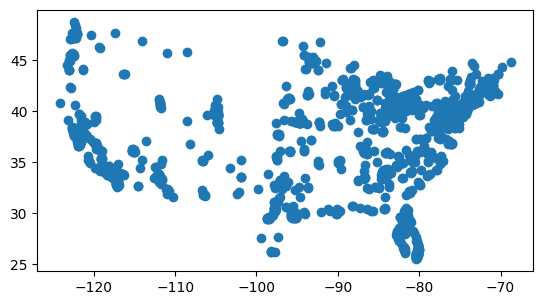

In [15]:
chipotle.plot()

<Axes: >

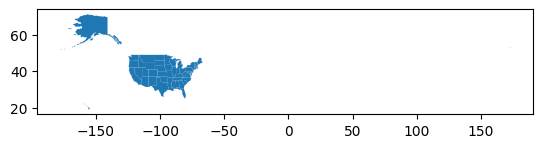

In [16]:
geo_json_data.plot()

In [16]:
### Funciones basicas
### Hacer un spatial join
join = gpd.sjoin(chipotle.to_crs(geo_json_data.crs),geo_json_data,how='left',predicate='intersects')

In [50]:
gpd.sjoin_nearest(chipotle.to_crs(3395),geo_json_data.to_crs(3395),how='left',distance_col='Distancia_M').sort_values(by='Distancia_M')

,state,location,address,latitude,longitude,geometry,index_right,id,name,N_Local,Prueba,Distancia_M
0,Alabama,Auburn,"346 W Magnolia Ave Auburn, AL 36832 US",32.606813,-85.487328,"POLYGON ((-9515905.859 3820207.037, -9515908.2...",0,AL,Alabama,15.0,"(10.333, 54.333]",0.000000
1732,New York,White Plains,"250 Main St Ste 101 White Plains, NY 10601 US",41.033227,-73.764394,"POLYGON ((-8210914.744 4989186.035, -8210917.1...",31,NY,New York,156.0,"(54.333, 414.0]",0.000000
1733,New York,White Plains,"405 Tarrytown Rd White Plains, NY 10607 US",41.042562,-73.799515,"POLYGON ((-8214824.446 4990558.42, -8214826.85...",31,NY,New York,156.0,"(54.333, 414.0]",0.000000
1734,New York,Williamsville,"8020 Transit Rd Unit 23 Williamsville, NY 1422...",42.985650,-78.697541,"POLYGON ((-8760070.224 5280645.694, -8760072.6...",31,NY,New York,156.0,"(54.333, 414.0]",0.000000
1735,New York,Yonkers,"5510 Xavier Dr Space 5A10 Yonkers, NY 10704 US",40.926848,-73.853664,"POLYGON ((-8220852.303 4973559.894, -8220854.7...",31,NY,New York,156.0,"(54.333, 414.0]",0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...
2582,Washington DC,Washington DC,"1508 14th St NW Ste 1 Washington, DC 20005 US",38.910017,-77.032181,"POLYGON ((-8574683.219 4681948.433, -8574685.6...",45,VA,Virginia,102.0,"(54.333, 414.0]",6939.921133
2597,Washington DC,Washington DC,"50 Massachusetts Ave NE Spc L037 Washington, D...",38.897677,-77.006877,"POLYGON ((-8571866.313 4680190.448, -8571868.7...",19,MD,Maryland,94.0,"(54.333, 414.0]",6948.664402
2580,Washington DC,Washington DC,"1045 5th St NW Washington, DC 20001 US",38.903123,-77.018662,"POLYGON ((-8573178.269 4680966.179, -8573180.6...",19,MD,Maryland,94.0,"(54.333, 414.0]",7329.420728
2598,Washington DC,Washington DC,"601 F St NW Washington, DC 20004 US",38.898082,-77.021014,"POLYGON ((-8573440.076 4680248.139, -8573442.4...",45,VA,Virginia,102.0,"(54.333, 414.0]",7425.950964


In [17]:
join.head()

,state,location,address,latitude,longitude,geometry,index_right,id,name
0,Alabama,Auburn,"346 W Magnolia Ave Auburn, AL 36832 US",32.606813,-85.487328,POINT (-85.48733 32.60681),0.0,AL,Alabama
1,Alabama,Birmingham,"300 20th St S Birmingham, AL 35233 US",33.509721,-86.802756,POINT (-86.80276 33.50972),0.0,AL,Alabama
2,Alabama,Birmingham,"3220 Morrow Rd Birmingham, AL 35235 US",33.595581,-86.647437,POINT (-86.64744 33.59558),0.0,AL,Alabama
3,Alabama,Birmingham,"4719 Highway 280 Birmingham, AL 35242 US",33.422582,-86.698279,POINT (-86.69828 33.42258),0.0,AL,Alabama
4,Alabama,Cullman,"1821 Cherokee Ave SW Cullman, AL 35055 US",34.154134,-86.841220,POINT (-86.84122 34.15413),0.0,AL,Alabama


In [19]:
join.shape

(2629, 9)

In [20]:
chipotle.shape

(2629, 6)

In [21]:
conteo = join.groupby('id').size().reset_index(name='N_Local')
conteo

,id,N_Local
0,AL,15
1,AR,6
2,AZ,85
3,CA,414
4,CO,79
5,CT,23
6,DE,9
7,FL,177
8,GA,61
9,IA,10


In [22]:
chipotle.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [24]:
### Generar un buffer
chipotle['geometry'] = chipotle.to_crs(3395)['geometry'].buffer(distance = 500)

In [26]:
chipotle.crs

<Projected CRS: EPSG:3395>
Name: WGS 84 / World Mercator
Axis Info [cartesian]:
- E[east]: Easting (metre)
- N[north]: Northing (metre)
Area of Use:
- name: World between 80°S and 84°N.
- bounds: (-180.0, -80.0, 180.0, 84.0)
Coordinate Operation:
- name: World Mercator
- method: Mercator (variant A)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [28]:
import folium
map = folium.Map(location=[43.0677232194901	,-88.04822244204952	 ], zoom_start=12, control_scale=True)
folium.GeoJson(chipotle,name='Locales',show=True).add_to(map)
folium.LayerControl().add_to(map)
folium.FitOverlays(fit_on_map_load=True).add_to(map)
map

In [29]:
### Generar un dissolve
cobertura = chipotle.dissolve(by='state')

In [31]:
cobertura = cobertura.reset_index()[['state','geometry']]

In [32]:
cobertura

,state,geometry
0,Alabama,"MULTIPOLYGON (((-9811639.334 3568715.972, -981..."
1,Arizona,"MULTIPOLYGON (((-12757015.382 3832046.986, -12..."
2,Arkansas,"MULTIPOLYGON (((-10278921.908 4105777.222, -10..."
3,California,"MULTIPOLYGON (((-13583893.061 4410623.563, -13..."
4,Colorado,"MULTIPOLYGON (((-12087537.061 4706409.613, -12..."
5,Connecticut,"MULTIPOLYGON (((-8190239.961 4990346.479, -819..."
6,Delaware,"MULTIPOLYGON (((-8360866.408 4654459.938, -836..."
7,Florida,"MULTIPOLYGON (((-9186742.965 3143350.215, -918..."
8,Georgia,"MULTIPOLYGON (((-9455337.373 3803690.052, -945..."
9,Idaho,"MULTIPOLYGON (((-12943996.032 5375198.697, -12..."


In [37]:
cobertura['Area'] = cobertura['geometry'].area

In [33]:
map = folium.Map(location=[43.0677232194901, -88.04822244204952], zoom_start=12, control_scale=True)
folium.GeoJson(
    cobertura,
    name='cobertura',
    show=True,
    highlight_function=lambda x: {'weight': 5, 'color': 'blue', 'fillOpacity': 1},
    popup=folium.GeoJsonPopup(fields=['state'], labels=True)
).add_to(map)
folium.LayerControl().add_to(map)
folium.FitOverlays(fit_on_map_load=True).add_to(map)
map

In [38]:
### Ejemplo de mapa Rapido
import random
map = folium.Map(location=[43.0677232194901, -88.04822244204952], zoom_start=12, control_scale=True)

# Crear colores únicos por estado
state_colors = {state: f'#{random.randint(0, 0xFFFFFF):06x}' for state in chipotle['state'].unique()}
grupo_locales = folium.FeatureGroup(name='Locales', show=True)

# Agregar todos los puntos con color según el estado
for _, row in chipotle.iterrows():
    color = state_colors[row['state']]
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=5,
        color=color,
        fill=True,
        fill_color=color,
        fill_opacity=0.7,
        popup=folium.Popup(
            f"<b>State:</b> {row['state']}<br><b>Location:</b> {row['location']}<br><b>Address:</b> {row['address']}",
            max_width=300
        )
    ).add_to(grupo_locales)
grupo_locales.add_to(map)
folium.GeoJson(geo_json_data, name='Limites', show=False).add_to(map)
folium.LayerControl(collapsed=False).add_to(map)
folium.FitOverlays(fit_on_map_load=True).add_to(map)
map

In [39]:
map.save('Mapa_ejemplo.html')

In [40]:
geo_json_data = geo_json_data.merge(conteo,on='id',how='left')

In [46]:
geo_json_data

,id,name,geometry,N_Local,Prueba
0,AL,Alabama,"POLYGON ((-87.3593 35.00118, -85.60668 34.9847...",15.0,"(10.333, 54.333]"
1,AK,Alaska,"MULTIPOLYGON (((-131.60202 55.11798, -131.5691...",NaN,NaN
2,AZ,Arizona,"POLYGON ((-109.0425 37.00026, -109.04798 31.33...",85.0,"(54.333, 414.0]"
3,AR,Arkansas,"POLYGON ((-94.47384 36.50186, -90.15254 36.496...",6.0,"(0.999, 10.333]"
4,CA,California,"POLYGON ((-123.23326 42.00619, -122.37885 42.0...",414.0,"(54.333, 414.0]"
5,CO,Colorado,"POLYGON ((-107.91973 41.00391, -105.72895 40.9...",79.0,"(54.333, 414.0]"
6,CT,Connecticut,"POLYGON ((-73.05353 42.03905, -71.79931 42.022...",23.0,"(10.333, 54.333]"
7,DE,Delaware,"POLYGON ((-75.41409 39.80446, -75.5072 39.6839...",9.0,"(0.999, 10.333]"
8,FL,Florida,"POLYGON ((-85.49714 30.99754, -85.00421 31.003...",177.0,"(54.333, 414.0]"
9,GA,Georgia,"POLYGON ((-83.10919 35.00118, -83.32279 34.787...",61.0,"(54.333, 414.0]"


In [45]:
geo_json_data['Prueba'] = pd.qcut(geo_json_data['N_Local'],q=3)

In [47]:
geo_json_data.to_file('shp/capa_zonas.shp',driver='ESRI Shapefile')